## Importing Libaries

In [215]:
import pandas as pd
import numpy as np
import random
from faker import Faker
from ydata_profiling import ProfileReport
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.colors as mcolors
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
import xgboost as xgb
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans

# Synthetic Data Generation

In [16]:
# Initialize Faker for realistic fake data
faker = Faker()

# Set a random seed for reproducibility
np.random.seed(42)

# Define the number of records to generate
num_records = 1000

# Generate synthetic data
data = {
    "CustomerID": [f"CUST{str(i).zfill(6)}" for i in range(1, num_records + 1)],
    "Age": np.random.randint(18, 70, num_records),
    "Gender": np.random.choice(["Male", "Female", "Non-Binary"], num_records, p=[0.48, 0.48, 0.04]),
    "Location": [faker.city() for _ in range(num_records)],
    "MembershipLevel": np.random.choice(["Bronze", "Silver", "Gold", "Platinum"], num_records, p=[0.4, 0.3, 0.2, 0.1]),
    "TotalPurchases": np.random.poisson(lam=5, size=num_records),
    "TotalSpent": np.random.uniform(20, 5000, num_records),
    "FavoriteCategory": np.random.choice(["Electronics", "Clothing", "Home Goods", "Books", "Toys"], num_records),
    "LastPurchaseDate": [faker.date_between(start_date="-1y", end_date="today") for _ in range(num_records)],
    "WebsiteClickRate": np.random.uniform(0.5, 20, num_records),
    "TimeSpentOnSite": np.random.uniform(0, 300, num_records),
    "SocialMediaEngagement": np.random.randint(1, 101, num_records),
    "AdClickHistory": np.random.uniform(0, 1, num_records),
    "CustomerSentimentScore": np.random.uniform(-1, 1, num_records),
    "Churn": np.random.choice([0, 1], num_records, p=[0.8, 0.2]),
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Introduce some missing values randomly
for col in ["Age", "TotalPurchases", "TotalSpent", "FavoriteCategory", "LastPurchaseDate"]:
    df.loc[df.sample(frac=0.1).index, col] = np.nan

# Save the dataset for further use
df.to_csv("synthetic_ecommerce_data.csv", index=False)

print("Synthetic dataset generated successfully!")
df.head()

Synthetic dataset generated successfully!


,CustomerID,Age,Gender,Location,MembershipLevel,TotalPurchases,TotalSpent,FavoriteCategory,LastPurchaseDate,WebsiteClickRate,TimeSpentOnSite,SocialMediaEngagement,AdClickHistory,CustomerSentimentScore,Churn
0,CUST000001,56.0,Female,Houstonmouth,Bronze,8.0,3864.718294,Toys,2024-07-13,16.461580,125.901688,88,0.637305,0.823475,0
1,CUST000002,69.0,Male,North Danielle,Bronze,6.0,4144.499534,Clothing,2024-03-05,7.641934,294.413131,97,0.739418,-0.491320,1
2,CUST000003,46.0,Male,Fullerchester,Platinum,3.0,NaN,Toys,NaN,12.230196,104.845555,63,0.181050,0.545053,0
3,CUST000004,32.0,Male,Rachelton,Platinum,7.0,4489.146869,Clothing,2024-08-04,12.323180,276.518226,91,0.959007,-0.469054,1
4,CUST000005,60.0,Male,Danielport,Silver,5.0,3287.607537,Books,2024-02-12,7.617993,279.888765,21,0.638739,-0.582515,1


### Dataset Description

| **Column**            | **Description**                                                     |
|------------------------|---------------------------------------------------------------------|
| CustomerID            | Unique identifier for each customer.                               |
| Age                   | Age of the customer (e.g., 18-75).                                 |
| Gender                | Gender of the customer (e.g., Male, Female, Non-binary).           |
| Location              | Geographic location (e.g., city, state, or country).              |
| MembershipLevel       | Membership level (e.g., Bronze, Silver, Gold, Platinum).           |
| TotalPurchases        | Total number of purchases (e.g., 0-200).                           |
| TotalSpent            | Total amount spent by the customer (e.g., 0-50,000).           |
| FavoriteCategory      | Most frequently purchased category (e.g., Electronics, Clothing, Home Goods, Books, Toys).  |
| LastPurchaseDate      | Date of the last purchase (e.g., YYYY-MM-DD).                      |
| WebsiteClickRate      | Average number of clicks per session (e.g., 0.5-20).                |
| TimeSpentOnSite       | Average time spent on site per visit (e.g., 0-300 minutes).        |
| SocialMediaEngagement | Level of engagement on social media (e.g., 1-100). |
| AdClickHistory        | Interaction with ads (e.g., Click-through rate, 0-100%).           |
| CustomerSentimentScore| Sentiment score from interactions/reviews (e.g., -1 to 1).         |
| Churn                 | TARGET: Indicates churn status (**1** for *churned*, **0** for *active*).              |


# Exploratory Data Analysis (EDA)

In [34]:
# Step 1: Load the dataset
data = pd.read_csv('synthetic_ecommerce_data.csv')

In [17]:
# Step 2: Generate the profiling report
profile = ProfileReport(data, title="E-Commerce Customer Behaviour Analysis", explorative=True)

# Step 3: Save the report as an HTML file
profile.to_file("EDA_Report.html")

# Step 4: Display the report in a notebook (optional)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Preprocessing

## Handling Missing Values

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              1000 non-null   object 
 1   Age                     900 non-null    float64
 2   Gender                  1000 non-null   object 
 3   Location                1000 non-null   object 
 4   MembershipLevel         1000 non-null   object 
 5   TotalPurchases          900 non-null    float64
 6   TotalSpent              900 non-null    float64
 7   FavoriteCategory        900 non-null    object 
 8   LastPurchaseDate        900 non-null    object 
 9   WebsiteClickRate        1000 non-null   float64
 10  TimeSpentOnSite         1000 non-null   float64
 11  SocialMediaEngagement   1000 non-null   int64  
 12  AdClickHistory          1000 non-null   float64
 13  CustomerSentimentScore  1000 non-null   float64
 14  Churn                   1000 non-null   i

In [35]:
# Step 1: Separate numerical and categorical columns
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = data.select_dtypes(include=['object', 'category']).columns

# Step 2: Handle missing values
# Fill numerical columns with the mean
for col in numerical_cols:
    if data[col].isnull().sum() > 0:  # Check for missing values
        data[col].fillna(data[col].mean(), inplace=True)

# Fill categorical columns with the mode
for col in categorical_cols:
    if data[col].isnull().sum() > 0:  # Check for missing values
        data[col].fillna(data[col].mode()[0], inplace=True)

# Step 3: Verify that missing values are handled
print(data.isnull().sum())  # Should print 0 for all columns if missing values are handled

CustomerID                0
Age                       0
Gender                    0
Location                  0
MembershipLevel           0
TotalPurchases            0
TotalSpent                0
FavoriteCategory          0
LastPurchaseDate          0
WebsiteClickRate          0
TimeSpentOnSite           0
SocialMediaEngagement     0
AdClickHistory            0
CustomerSentimentScore    0
Churn                     0
dtype: int64


<ipython-input-35-88580580b054>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mean(), inplace=True)
<ipython-input-35-88580580b054>:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usi

## Feature Engineering

### Creating New Attributes

In [36]:
# Create new features
# 1. Recency (days since last purchase)
data['Recency'] = (pd.Timestamp.now() - pd.to_datetime(data['LastPurchaseDate'])).dt.days

# 2. Frequency (average purchases per month)
data['Frequency'] = data['TotalPurchases'] / (data['Recency'] / 30)

# 3. Monetary (average amount spent per purchase)
data['Monetary'] = data['TotalSpent'] / data['TotalPurchases']

# Handle infinite or missing values caused by division
data.replace([float('inf'), -float('inf')], 0, inplace=True)
data.fillna(0, inplace=True)

# Display new features
print(data[['Recency', 'Frequency', 'Monetary']].head())

   Recency  Frequency    Monetary
0      189   1.269841  483.089787
1      319   0.564263  690.749922
2      150   0.600000  833.329999
3      167   1.257485  641.306696
4      341   0.439883  657.521507


### Feature Selection (*Feature Importance from Random Forest*)

In [50]:
# Make a copy
data_copy = data.copy()

# Define a LabelEncoder instance
label_encoder = LabelEncoder()

# Encode 'Gender' and 'MembershipLevel' using LabelEncoder
data_copy['Gender'] = label_encoder.fit_transform(data_copy['Gender'])
data_copy['MembershipLevel'] = label_encoder.fit_transform(data_copy['MembershipLevel'])

# If there are other categorical columns, apply the same encoding technique
categorical_columns = ['Location', 'FavoriteCategory']  # Add more categorical columns here if needed
for col in categorical_columns:
    data_copy[col] = label_encoder.fit_transform(data_copy[col])

# Now, all categorical variables are numerically encoded, and the number of variables remains the same

# Define target variable (e.g., 'Churn') and features
X = data_copy.drop(columns=['Churn', 'CustomerID', 'LastPurchaseDate'])  # Drop irrelevant columns
y = data_copy['Churn']  # Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a Random Forest Classifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Get feature importance
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Define a colormap with specific colors to highlight top features
colors = ["lightgray", "lightgray", "#0f4c81"]
colormap = mcolors.LinearSegmentedColormap.from_list("custom_colormap", colors)

# Apply the custom colormap to the DataFrame for visual emphasis
styled_df = feature_importances.style.background_gradient(cmap=colormap)

# Display the styled DataFrame with highlighted feature importances
styled_df

,Feature,Importance
7,WebsiteClickRate,0.085234
10,AdClickHistory,0.084798
11,CustomerSentimentScore,0.083908
8,TimeSpentOnSite,0.083602
2,Location,0.083019
14,Monetary,0.081275
5,TotalSpent,0.077929
0,Age,0.076111
9,SocialMediaEngagement,0.075987
12,Recency,0.075346


In [51]:
# Select only the top 12 features
selected_features = feature_importances.head(12)['Feature'].tolist()

# Create a new DataFrame with only the selected features and the target variable
df_selected = data[selected_features + ['Churn']]

In [112]:
df_selected.head()

,WebsiteClickRate,AdClickHistory,CustomerSentimentScore,TimeSpentOnSite,Location,Monetary,TotalSpent,Age,SocialMediaEngagement,Recency,Frequency,TotalPurchases,Churn
0,16.461580,0.637305,0.823475,125.901688,Houstonmouth,483.089787,3864.718294,56.0,88,189,1.269841,8.0,0
1,7.641934,0.739418,-0.491320,294.413131,North Danielle,690.749922,4144.499534,69.0,97,319,0.564263,6.0,1
2,12.230196,0.181050,0.545053,104.845555,Fullerchester,833.329999,2499.989996,46.0,63,150,0.600000,3.0,0
3,12.323180,0.959007,-0.469054,276.518226,Rachelton,641.306696,4489.146869,32.0,91,167,1.257485,7.0,1
4,7.617993,0.638739,-0.582515,279.888765,Danielport,657.521507,3287.607537,60.0,21,341,0.439883,5.0,1


## Label Encoding

In [113]:
# Define a LabelEncoder instance
label_encoder = LabelEncoder()

# Make a final copy
final_dataset = df_selected.copy()

# Encode 'Location' using LabelEncoder
final_dataset['Location'] = label_encoder.fit_transform(final_dataset['Location']) + 1

# Display the processed dataset
final_dataset.head()

,WebsiteClickRate,AdClickHistory,CustomerSentimentScore,TimeSpentOnSite,Location,Monetary,TotalSpent,Age,SocialMediaEngagement,Recency,Frequency,TotalPurchases,Churn
0,16.461580,0.637305,0.823475,125.901688,261,483.089787,3864.718294,56.0,88,189,1.269841,8.0,0
1,7.641934,0.739418,-0.491320,294.413131,559,690.749922,4144.499534,69.0,97,319,0.564263,6.0,1
2,12.230196,0.181050,0.545053,104.845555,219,833.329999,2499.989996,46.0,63,150,0.600000,3.0,0
3,12.323180,0.959007,-0.469054,276.518226,703,641.306696,4489.146869,32.0,91,167,1.257485,7.0,1
4,7.617993,0.638739,-0.582515,279.888765,113,657.521507,3287.607537,60.0,21,341,0.439883,5.0,1


## Equal-Width Binning / Discretization

In [114]:
final_dataset['Location'].min()

1

In [115]:
# Define the bin edges and corresponding labels
bins = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]  # Edges of the bins
labels = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]    # Labels for each bin

# Apply pd.cut() to create the new 'Location' values
final_dataset['Location'] = pd.cut(final_dataset['Location'], bins=bins, labels=labels, right=True)

# Display the transformed dataset
print(final_dataset['Location'].head())

0    300
1    600
2    300
3    800
4    200
Name: Location, dtype: category
Categories (10, int64): [100 < 200 < 300 < 400 ... 700 < 800 < 900 < 1000]


In [116]:
len(final_dataset['Location'].unique())

10

## Train-Test Splitting

In [117]:
# Define target variable (e.g., 'Churn') and features
X = final_dataset.drop(columns=['Churn'])  # Drop target columns
y = final_dataset['Churn']  # Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Check the shape of the splits to confirm
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (700, 12)
X_test shape: (300, 12)
y_train shape: (700,)
y_test shape: (300,)


## Feature Scaling

In [118]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the features (X_train)
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test set (X_test)
X_test_scaled = scaler.transform(X_test)

# Convert back to DataFrame for easier visualization (optional)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Check the scaled data
X_train_scaled.head()

,WebsiteClickRate,AdClickHistory,CustomerSentimentScore,TimeSpentOnSite,Location,Monetary,TotalSpent,Age,SocialMediaEngagement,Recency,Frequency,TotalPurchases
0,-0.319335,1.152223,0.881747,-0.075172,1.669566,-0.656888,-0.446485,-0.548944,-0.741256,0.211338,-0.156277,1.105854
1,-0.748512,0.412995,-1.183430,0.765346,0.597040,0.014137,0.007715,-0.261853,-0.918178,0.231084,-0.201285,-0.437791
2,1.502931,-0.104948,-1.524171,-0.629559,1.669566,-0.702643,-1.329569,-0.548944,-1.342793,-1.042531,-0.134917,-0.952339
3,0.730925,0.153420,1.223447,-0.237864,-0.117978,0.621948,0.981690,1.101833,0.851049,1.504699,-0.224340,-0.437791
4,-1.692384,0.747216,1.458943,-0.089042,-1.190504,0.031524,0.518384,0.742969,-1.024332,0.389052,-0.192083,0.076758


## Data Resampling (SMOTE)

Before OverSampling, counts of label '1': 136
Before OverSampling, counts of label '0': 564 



<ipython-input-119-58411336f002>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y, palette='coolwarm')


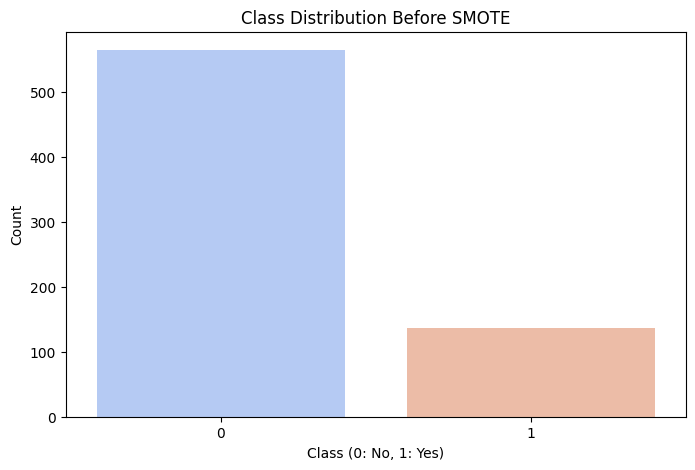

<ipython-input-119-58411336f002>:21: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  X_train_res, y_train_res = sm.fit_resample(X_train_scaled, y_train.ravel())
<ipython-input-119-58411336f002>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y, palette='coolwarm')


After OverSampling, counts of label '1': 564
After OverSampling, counts of label '0': 564


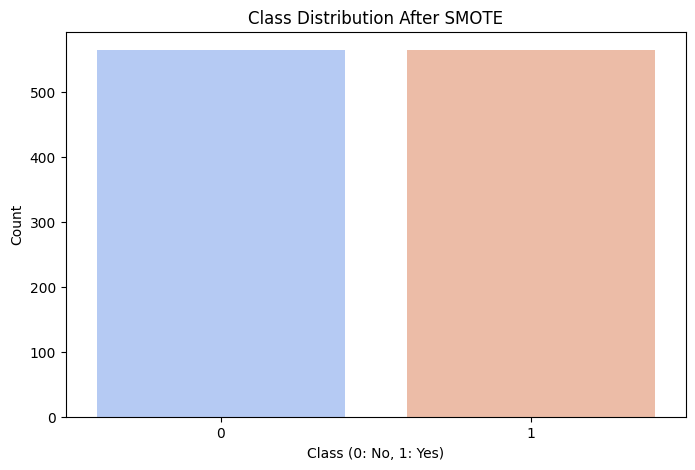

After OverSampling, the shape of train_X: (1128, 12)
After OverSampling, the shape of train_y: (1128,) 



In [119]:
# Function to plot the class distribution
def plot_class_distribution(y, title):
    plt.figure(figsize=(8, 5))
    sns.countplot(x=y, palette='coolwarm')
    plt.title(title)
    plt.xlabel('Class (0: No, 1: Yes)')
    plt.ylabel('Count')
    plt.show()

# Displaying the class distribution before applying SMOTE
print("Before OverSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train==0)))

# Plotting the distribution before SMOTE
plot_class_distribution(y_train, "Class Distribution Before SMOTE")

# Initializing SMOTE with random_state=2 to ensure reproducibility of the sampling process
sm = SMOTE(random_state=2)

# Applying SMOTE to the training set to generate synthetic samples for the minority class
X_train_res, y_train_res = sm.fit_resample(X_train_scaled, y_train.ravel())

# Displaying the count of each class after applying SMOTE
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

# Plotting the distribution after SMOTE
plot_class_distribution(y_train_res, "Class Distribution After SMOTE")

# Displaying the shape of the newly balanced training set
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

# Model Building

## Supervised Learning

### Decision Tree (DT)

In [146]:
# Initialize the Decision Tree model with max_depth=4 for pruning
dt_model = DecisionTreeClassifier(random_state=42, max_depth=4)

# Train the model
dt_model.fit(X_train_res, y_train_res)

# Make predictions
y_pred_dt = dt_model.predict(X_test)

# Evaluate the model
print("Decision Tree Classifier:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_dt)}")
print(classification_report(y_test, y_pred_dt))

Decision Tree Classifier:
Accuracy: 0.7833333333333333
              precision    recall  f1-score   support

           0       0.79      0.99      0.88       237
           1       0.00      0.00      0.00        63

    accuracy                           0.78       300
   macro avg       0.39      0.50      0.44       300
weighted avg       0.62      0.78      0.69       300



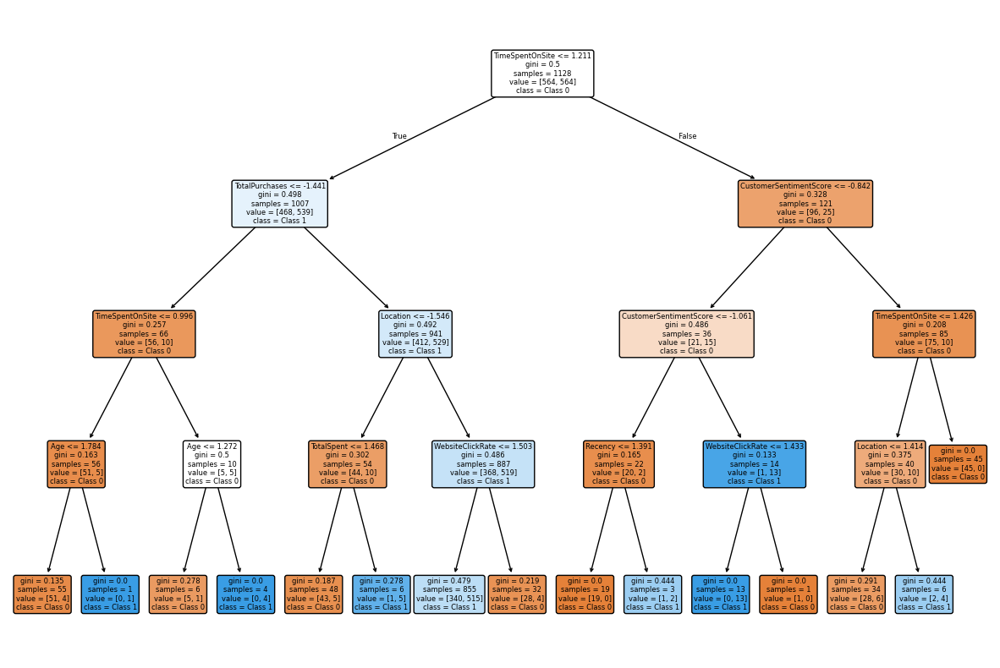

In [147]:
# Visualize the pruned decision tree with smaller nodes
plt.figure(figsize=(15,10))  # Adjust the figure size to be more compact
plot_tree(dt_model,
          feature_names=X_train_res.columns,  # Names of features
          class_names=['Class 0', 'Class 1'],  # Class names (adjust according to your problem)
          filled=True,
          rounded=True,
          fontsize=6)  # Reduce font size for better readability
plt.show()

### Random Forest (RF)

In [148]:
# Initialize the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Train the model
rf_model.fit(X_train_res, y_train_res)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
print("Random Forest Classifier:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf)}")
print(classification_report(y_test, y_pred_rf))

Random Forest Classifier:
Accuracy: 0.78
              precision    recall  f1-score   support

           0       0.79      0.99      0.88       237
           1       0.00      0.00      0.00        63

    accuracy                           0.78       300
   macro avg       0.39      0.49      0.44       300
weighted avg       0.62      0.78      0.69       300



### Extreme Gradient Boosting (XGBoost)

In [154]:
# Initialize the XGBoost model
xgb_model = xgb.XGBClassifier(random_state=42)

# Train the model
xgb_model.fit(X_train_res, y_train_res)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate the model
print("XGBoost Classifier:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb)}")
print(classification_report(y_test, y_pred_xgb))

XGBoost Classifier:
Accuracy: 0.7733333333333333
              precision    recall  f1-score   support

           0       0.79      0.98      0.87       237
           1       0.00      0.00      0.00        63

    accuracy                           0.77       300
   macro avg       0.39      0.49      0.44       300
weighted avg       0.62      0.77      0.69       300



### Evaluation

In [155]:
# Evaluate Model 1 (Decision Tree)
y_pred_dt = dt_model.predict(X_test)
y_pred_dt_prob = dt_model.predict_proba(X_test)[:, 1]  # Probabilities for the positive class
dt_metrics = {
    'Model': 'Decision Tree',
    'Accuracy': accuracy_score(y_test, y_pred_dt),
    'ROC AUC': roc_auc_score(y_test, y_pred_dt_prob)
}

# Evaluate Model 2 (Random Forest)
y_pred_rf = rf_model.predict(X_test)
y_pred_rf_prob = rf_model.predict_proba(X_test)[:, 1]  # Probabilities for the positive class
rf_metrics = {
    'Model': 'Random Forest',
    'Accuracy': accuracy_score(y_test, y_pred_rf),
    'ROC AUC': roc_auc_score(y_test, y_pred_rf_prob)
}

# Evaluate Model 3 (XGBoost)
y_pred_xgb = xgb_model.predict(X_test)
y_pred_xgb_prob = xgb_model.predict_proba(X_test)[:, 1]  # Probabilities for the positive class
xgb_metrics = {
    'Model': 'XGBoost',
    'Accuracy': accuracy_score(y_test, y_pred_xgb),
    'ROC AUC': roc_auc_score(y_test, y_pred_xgb_prob)
}

# Combine the metrics into a DataFrame
metrics_df = pd.DataFrame([dt_metrics, rf_metrics, xgb_metrics])

# Display the metrics table
print("Metrics Table:")
metrics_df

Metrics Table:


,Model,Accuracy,ROC AUC
0,Decision Tree,0.783333,0.495781
1,Random Forest,0.780000,0.583049
2,XGBoost,0.773333,0.531880


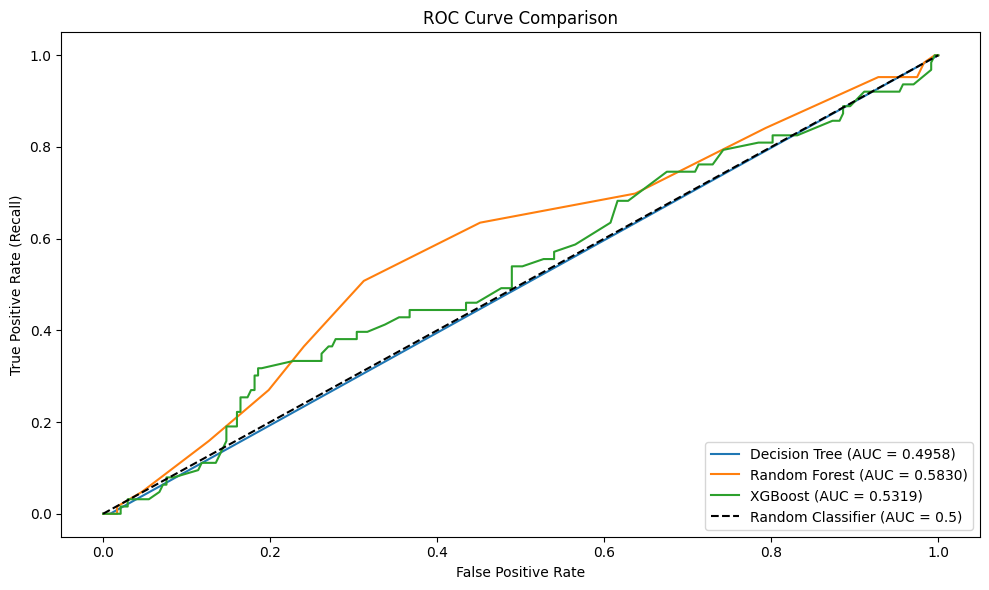

In [161]:
# Plot ROC curve for each model
plt.figure(figsize=(10, 6))

# Model 1 (Decision Tree)
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_pred_dt_prob)
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {roc_auc_score(y_test, y_pred_dt_prob):.4f})')

# Model 2 (Random Forest)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_rf_prob)
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {roc_auc_score(y_test, y_pred_rf_prob):.4f})')

# Model 3 (XGBoost)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_xgb_prob)
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {roc_auc_score(y_test, y_pred_xgb_prob):.4f})')

# Plot the diagonal (random classifier)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')

# Customize the plot
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.legend(loc='lower right')
plt.tight_layout()

# Show the plot
plt.show()

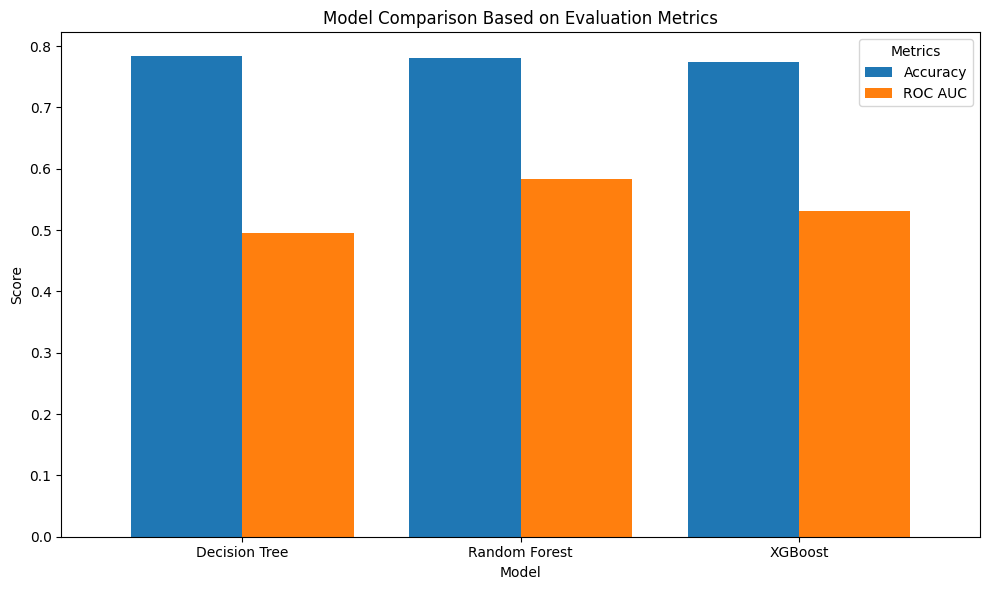

In [163]:
# Set up a plot for the metrics comparison
metrics_df.set_index('Model').plot(kind='bar', figsize=(10,6), width=0.8)

# Customize the plot
plt.title('Model Comparison Based on Evaluation Metrics')
plt.ylabel('Score')
plt.xlabel('Model')
plt.xticks(rotation=0)  # Set the x-axis labels to be horizontal
plt.legend(title='Metrics')
plt.tight_layout()

# Show the plot
plt.show()

## Unsupervised Learning

### Principal Component Analysis (PCA)

Explained Variance Ratio for each Principal Component:
[0.87126373 0.08295878]


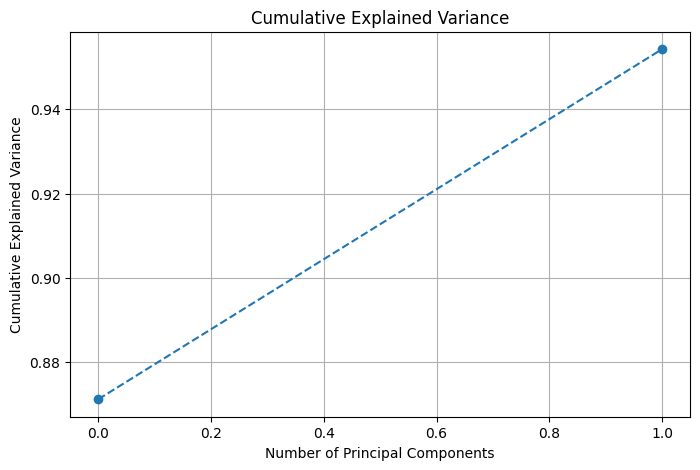

In [213]:
# Step 1: Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of variance
principal_components = pca.fit_transform(final_dataset)

# Step 2: Create a DataFrame for PCA results
pca_columns = [f'PC{i+1}' for i in range(principal_components.shape[1])]
pca_df = pd.DataFrame(principal_components, columns=pca_columns)

# Step 3: Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio for each Principal Component:")
print(explained_variance)

# Plot the cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(explained_variance), marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

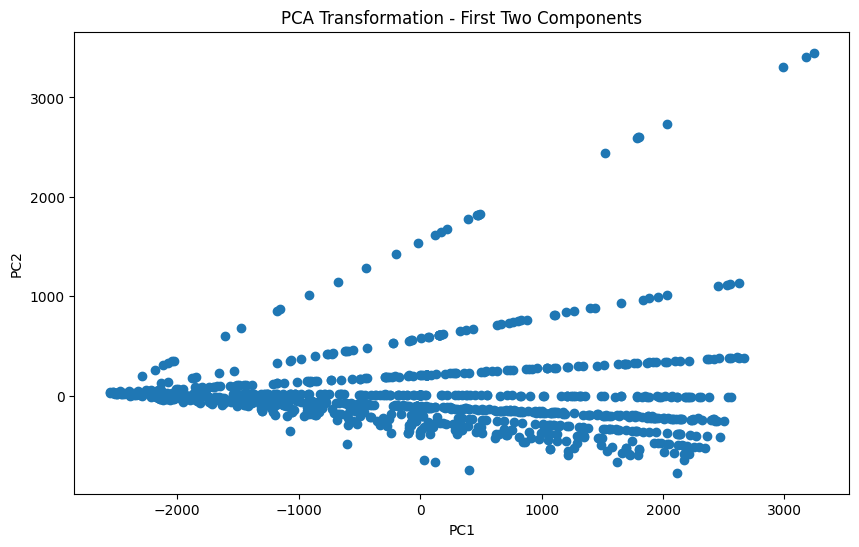

In [214]:
# Visualize the first two principal components from pca_df
plt.figure(figsize=(10, 6))
plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1])
plt.title('PCA Transformation - First Two Components')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

### K-Means Clustering

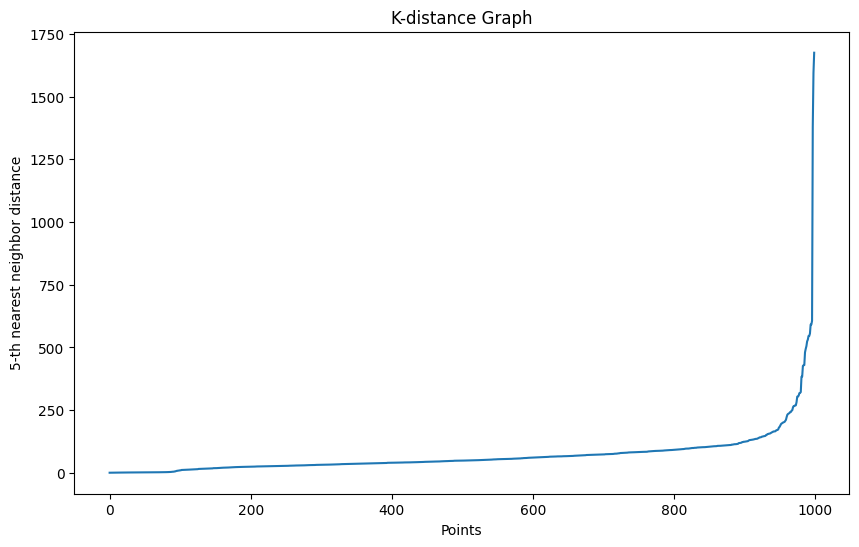

In [222]:
# Function to plot k-distance graph
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

# Plot k-distance graph (use pca_df for X)
plot_k_distance_graph(pca_df, k=5)

In [223]:
# Perform K-means clustering
n_clusters = 3  # Set the number of clusters based on your data or analysis
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters_kmeans = kmeans.fit_predict(pca_df)

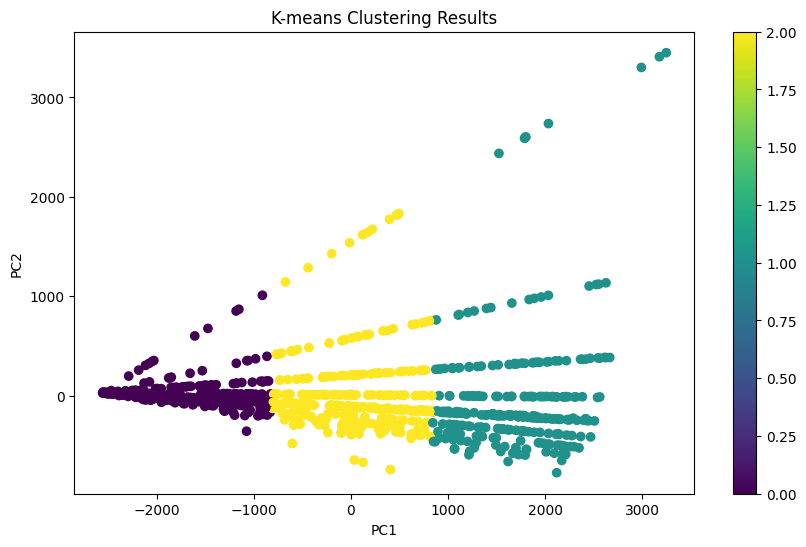

In [224]:
# Visualize the results
plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=clusters_kmeans, cmap='viridis')
plt.colorbar(scatter)
plt.title('K-means Clustering Results')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [225]:
# Print number of clusters
print(f'Number of clusters: {n_clusters}')

Number of clusters: 3


### Density-Based Spatial Clustering of Applications with Noise (DBSCAN)

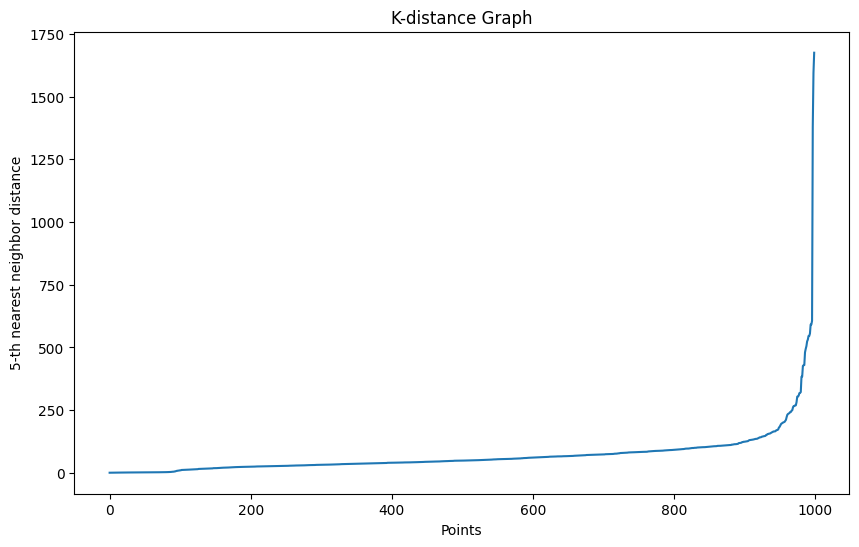

In [226]:
# Function to plot k-distance graph
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

# Plot k-distance graph (use pca_df for X)
plot_k_distance_graph(pca_df, k=5)

In [227]:
# Perform DBSCAN clustering
epsilon = 500  # You can adjust based on the k-distance graph plot
min_samples = 5  # Typically, 2 * number of features for 2D data
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
clusters_dbscan = dbscan.fit_predict(pca_df)

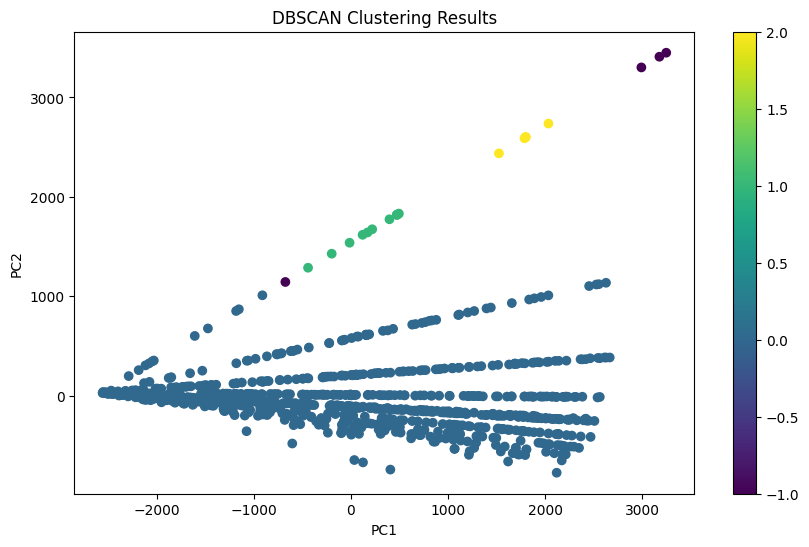

In [228]:
# Visualize the results
plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=clusters_dbscan, cmap='viridis')
plt.colorbar(scatter)
plt.title('DBSCAN Clustering Results')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [229]:
# Print number of clusters and noise points
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
print(f'Number of clusters: {n_clusters}')
print(f'Number of noise points: {n_noise}')

Number of clusters: 3
Number of noise points: 0


### Insights

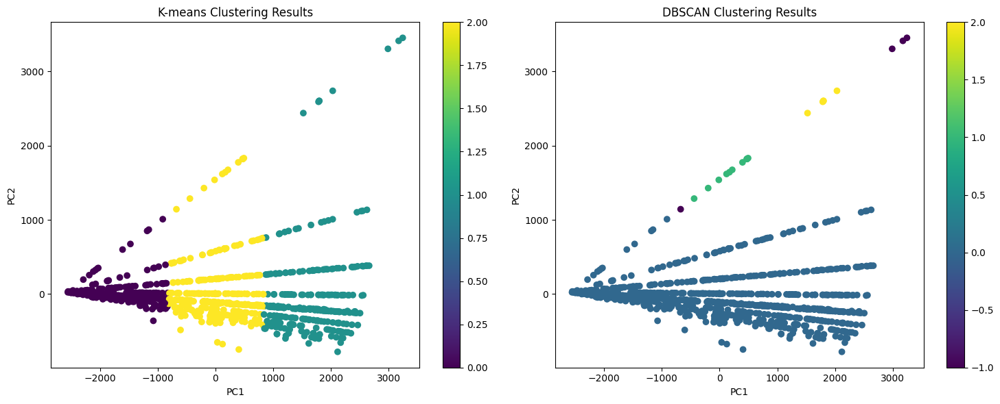

In [230]:
# Create subplots to visualize both clustering results together
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot K-means results on the first subplot
scatter_kmeans = ax1.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=clusters_kmeans, cmap='viridis')
ax1.set_title('K-means Clustering Results')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
fig.colorbar(scatter_kmeans, ax=ax1)

# Plot DBSCAN results on the second subplot
scatter_dbscan = ax2.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=clusters_dbscan, cmap='viridis')
ax2.set_title('DBSCAN Clustering Results')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
fig.colorbar(scatter_dbscan, ax=ax2)

# Adjust layout to make sure everything fits
plt.tight_layout()
plt.show()


## DBSCAN vs. K-Means

While both DBSCAN and K-Means are popular clustering algorithms, they have distinct characteristics that make them suitable for different types of data and use cases. Let's compare these two algorithms to understand when to use each one.

| **Feature**                     | **DBSCAN**                                                    | **K-Means**                                                  |
|----------------------------------|---------------------------------------------------------------|-------------------------------------------------------------|
| **Cluster Shape**                | Can identify clusters of arbitrary shapes                     | Assumes clusters are convex and roughly spherical           |
| **Number of Clusters**           | Does not require specifying the number of clusters beforehand | Requires specifying the number of clusters (K) in advance   |
| **Handling Outliers**            | Identifies outliers as noise points                           | Forces every point into a cluster, potentially distorting cluster shapes |
| **Sensitivity to Parameters**   | Sensitive to epsilon and MinPts parameters                    | Sensitive to initial centroid positions and the choice of K |
| **Cluster Density**              | Can find clusters of varying densities                        | Tends to find clusters of similar spatial extent and density|
| **Scalability**                  | Less efficient for large datasets, especially with high-dimensional data | Generally more efficient and scales better to large datasets |
| **Handling of Non-Globular Clusters** | Performs well on non-globular clusters                      | Struggles with non-globular shapes                         |
| **Consistency of Results**      | Produces consistent results across runs                       | Results can vary due to random initialization of centroids |